In [1]:
from PIL import Image
im = Image.open('./tissue_images/Human_AdrenalGland_01.tif')
im.show()

In [2]:
opts= {}
opts['imageType_train'] = '.tif'
opts['imageType_test'] = '.tif'
opts['number_of_channel'] = 3                   # Set if to '3' for RGB images and set it to '1' for grayscale images
opts['treshold'] = 0.5                          # treshold to convert the network output (stage 1) to binary masks
## input & output directories
opts['train_dir'] = './tissue_images/'
opts['train_label_dir'] = './Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask_binary/'
opts['train_label_dir_modify'] = './Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/mask_binary_without_border/'
opts['train_label_masks'] = './Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/label_masks_modify/'
opts['train_dis_dir'] = './Annotator 1 (biologist second round of manual marks up)/Annotator 1 (biologist second round of manual marks up)/distance_maps/'
# opts['results_save_path'] ='/kaggle/working/images/'
# opts['models_save_path'] ='/kaggle/working/models/'

In [3]:
import numpy as np
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb
import matplotlib.pyplot as plt
from glob import glob                                 # path control
import tqdm
from skimage.io import imsave, imread
from skimage.morphology import label

In [4]:
train_files = glob('{}*{}'.format(opts['train_dir'], opts['imageType_train']))
train_files_mask = glob('{}*.png'.format(opts['train_label_dir']))
train_files_mask_modify = glob('{}*.png'.format(opts['train_label_dir_modify']))
train_files_dis = glob('{}*.png'.format(opts['train_dis_dir']))
train_files_labels = glob('{}*.tif'.format(opts['train_label_masks']))


train_files.sort()
train_files_mask.sort() 
train_files_dis.sort()
train_files_labels.sort()
train_files_mask_modify.sort()
print("Total number of training images:", len(train_files))

Total number of training images: 30


In [5]:
train_files

['./tissue_images\\Human_AdrenalGland_01.tif',
 './tissue_images\\Human_AdrenalGland_02.tif',
 './tissue_images\\Human_AdrenalGland_03.tif',
 './tissue_images\\Human_Larynx_01.tif',
 './tissue_images\\Human_Larynx_02.tif',
 './tissue_images\\Human_Larynx_03.tif',
 './tissue_images\\Human_LymphNodes_01.tif',
 './tissue_images\\Human_LymphNodes_02.tif',
 './tissue_images\\Human_LymphNodes_03.tif',
 './tissue_images\\Human_Mediastinum_01.tif',
 './tissue_images\\Human_Mediastinum_02.tif',
 './tissue_images\\Human_Mediastinum_03.tif',
 './tissue_images\\Human_Pancreas_01.tif',
 './tissue_images\\Human_Pancreas_02.tif',
 './tissue_images\\Human_Pancreas_03.tif',
 './tissue_images\\Human_Pleura_01.tif',
 './tissue_images\\Human_Pleura_02.tif',
 './tissue_images\\Human_Pleura_03.tif',
 './tissue_images\\Human_Skin_01.tif',
 './tissue_images\\Human_Skin_02.tif',
 './tissue_images\\Human_Skin_03.tif',
 './tissue_images\\Human_Testes_01.tif',
 './tissue_images\\Human_Testes_02.tif',
 './tissue_i

Text(0.5, 1.0, 'label mask')

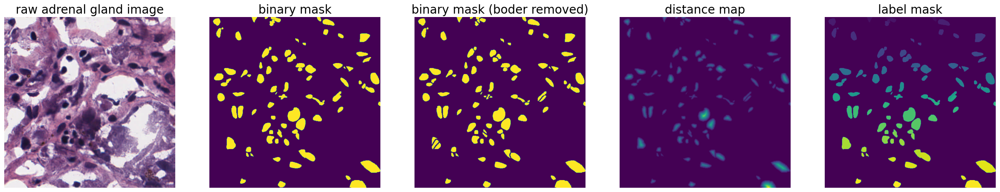

In [6]:
id = 0
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw adrenal gland image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

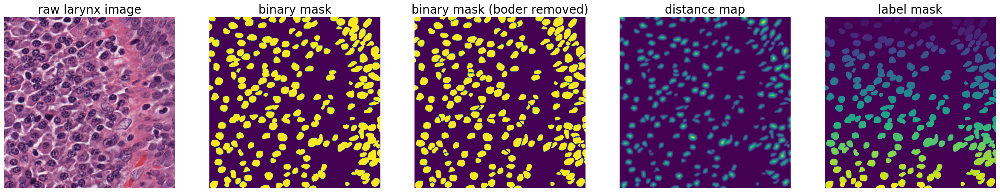

In [7]:
id = 4
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw larynx image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

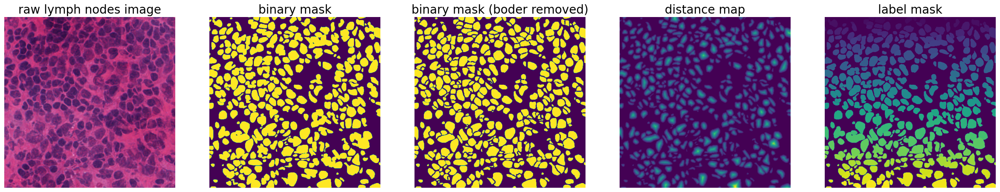

In [8]:
id = 7
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw lymph nodes image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

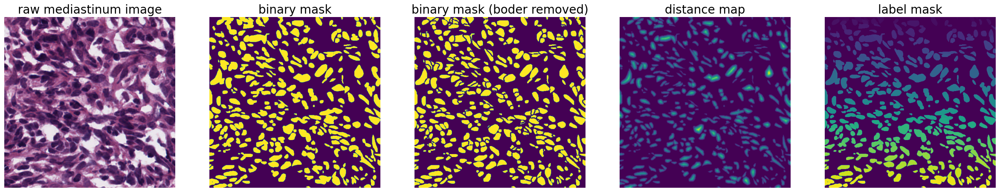

In [9]:
id = 10
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw mediastinum image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

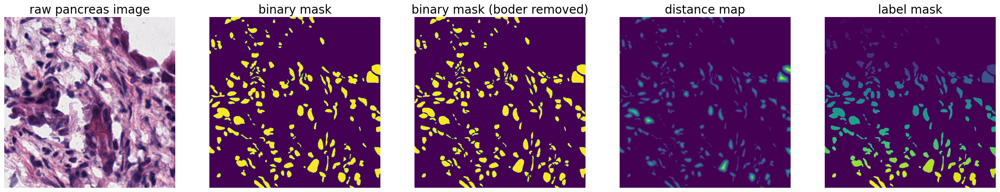

In [10]:
id = 13
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw pancreas image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

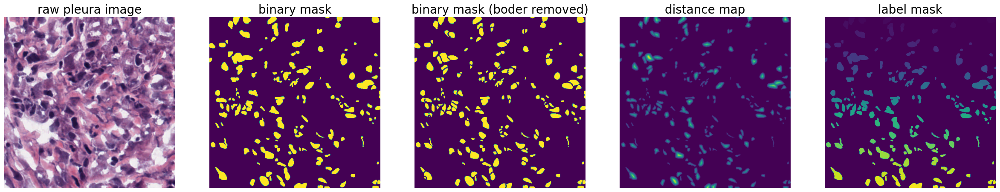

In [11]:
id = 16
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw pleura image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

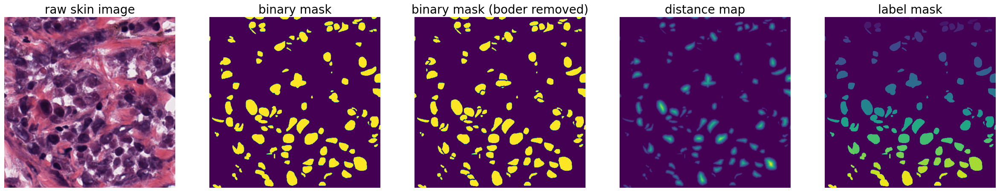

In [12]:
id = 19
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw skin image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

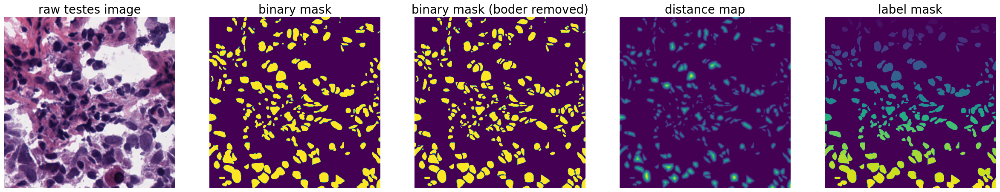

In [13]:
id = 22
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw testes image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

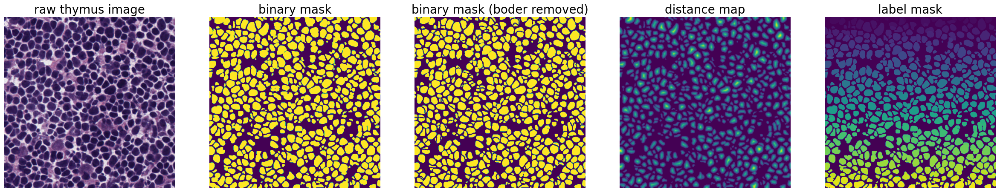

In [14]:
id = 25
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw thymus image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

Text(0.5, 1.0, 'label mask')

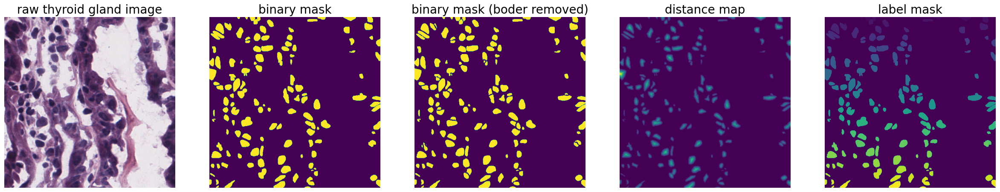

In [15]:
id = 28
plt.figure(figsize=(30,60))
plt.subplot(1,5,1)
plt.imshow(imread(train_files[id]), cmap = 'gray')
plt.axis('off') 
plt.title('raw thyroid gland image', fontsize = 20)

plt.subplot(1,5,2)
plt.imshow(imread(train_files_mask[id]))
plt.axis('off')
plt.title('binary mask', fontsize = 20)

plt.subplot(1,5,3)
plt.imshow(imread(train_files_mask_modify[id]))
plt.axis('off')
plt.title('binary mask (boder removed)', fontsize = 20)

plt.subplot(1,5,4)
plt.imshow(imread(train_files_dis[id]))
plt.axis('off')
plt.title('distance map', fontsize = 20)

plt.subplot(1,5,5)
plt.imshow(imread(train_files_labels[id]))
plt.axis('off')
plt.title('label mask', fontsize = 20)

In [16]:
# number of annotated nuclie
count = []
for i in range(len(train_files_labels)):
    img = imread(train_files_labels[i])
    count.append(len(np.unique(img)))

Adrenal_Gland = np.sum(count[0:3])
Larynx        = np.sum(count[3:6])
Lymph_Nodes   = np.sum(count[6:9])
Mediastinum   = np.sum(count[9:12])
Pancreas      = np.sum(count[12:15])
Pleura        = np.sum(count[15:18])
Skin          = np.sum(count[18:21])
Testes        = np.sum(count[21:24])
Thymus        = np.sum(count[24:27])
Thyroid_Gland = np.sum(count[27:30])

print('total number of annotated nuclei is:', np.sum(count))    
print('==============================================')
print('total number of annotated adrenal gland nuclei is:', Adrenal_Gland)    
print('total number of annotated larynx nuclei is:', Larynx)    
print('total number of annotated lymph nodes nuclei is:',Lymph_Nodes)     
print('total number of annotated mediastinum nuclei is:', Mediastinum)    
print('total number of annotated pancreas nuclei is:', Pancreas)    
print('total number of annotated pleura nuclei is:', Pleura)    
print('total number of annotated skin nuclei is:', Skin)    
print('total number of annotated testes nuclei is:', Testes)    
print('total number of annotated thymus nuclei is:', Thymus)    
print('total number of annotated thyroid gland nuclei is:', Thyroid_Gland)   

total number of annotated nuclei is: 8066
total number of annotated adrenal gland nuclei is: 347
total number of annotated larynx nuclei is: 644
total number of annotated lymph nodes nuclei is: 1311
total number of annotated mediastinum nuclei is: 1350
total number of annotated pancreas nuclei is: 550
total number of annotated pleura nuclei is: 518
total number of annotated skin nuclei is: 436
total number of annotated testes nuclei is: 795
total number of annotated thymus nuclei is: 1648
total number of annotated thyroid gland nuclei is: 467


In [18]:
pip install tensorflow



  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/8c/ca/c3f0114272924e690c34fd2698dcd877ab2d881fe4196cc461a98d2b4693/tensorflow-2.15.0-cp39-cp39-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.15.0 from https://files.pythonhosted.org/packages/1b/86/cda55138387a291fb684691d159742e6196daad571f01de60f809e266d40/tensorflow_intel-2.15.0-cp39-cp39-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/a2/ad/e0d3c824784ff121c03cc031f944bc7e139a8f1870ffd2845cc2dd76f6c4/absl_py-2.1.0-py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metadata
     ---------------------------------------- 57.5/57.5 kB 1.5 MB/s eta 0:00:00
  Obtaining dependency information for libcla


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose

def create_unet(input_shape=(512, 512, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # ...

    # Decoder
    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv2), conv1], axis=3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)

    # ...

    # Output layer
    output = Conv2D(1, (1, 1), activation='sigmoid')(conv3)  # Using 'conv3' instead of 'conv9'

    model = Model(inputs=[inputs], outputs=[output])
    return model

# Example usage:
input_shape = (512, 512, 3)
model = create_unet(input_shape)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 512, 512, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 conv2d_8 (Conv2D)           (None, 512, 512, 64)         36928     ['conv2d_7[0][0]']            
                                                                                                  
 max_pooling2d_2 (MaxPoolin  (None, 256, 256, 64)         0         ['conv2d_8[0][0]']            
 g2D)                                                                                         

In [28]:
import os
import numpy as np
from skimage.io import imread
from tensorflow.keras.utils import normalize

# Function to load and preprocess images
def load_images(file_paths, image_size):
    images = []
    for file_path in file_paths:
        image = imread(file_path) / 255.0  # Normalize to [0, 1]
        image = normalize(image)  # Further normalization if needed
        # Add any additional preprocessing steps here
        images.append(image)
    return np.array(images)

# Function to load label masks
def load_masks(file_paths, image_size):
    masks = []
    for file_path in file_paths:
        mask = imread(file_path) / 255.0  # Normalize to [0, 1]
        mask = normalize(mask)  # Further normalization if needed
        # Add any additional preprocessing steps here
        masks.append(mask)
    return np.array(masks)

# Assuming you have defined image_size (adjust based on your requirements)
image_size = (512, 512)

# Load and preprocess the data
X_train = load_images(train_files, image_size)
y_train = load_masks(train_files_labels, image_size)

# (Optional) Split the data into training and validation sets
# You can use tools like train_test_split from sklearn
# Example:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Display the shapes of the loaded data
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_val.shape)
print("y_test shape:", y_val.shape)


X_train shape: (24, 512, 512, 3)
y_train shape: (24, 512, 512)
X_test shape: (6, 512, 512, 3)
y_test shape: (6, 512, 512)


In [27]:
# Assuming you don't have a separate testing directory and your testing images are in the same directory as training images
test_files = glob('{}*{}'.format(opts['train_dir'], opts['imageType_test']))
test_files.sort()
print("Total number of testing images:", len(test_files))

# Load and preprocess the testing data
X_test = load_images(test_files, image_size)
# Assuming you don't have a separate set of label masks for testing and want to use the same labels as for training
y_test = load_masks(train_files_labels, image_size)

# Display the shapes of the loaded testing data
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


Total number of testing images: 30
X_test shape: (30, 512, 512, 3)
y_test shape: (30, 512, 512)


Epoch 1/10
6/6 [==============================] - 377s 67s/step - loss: 0.0995 - accuracy: 0.7691 - val_loss: 0.1020 - val_accuracy: 0.7293
Epoch 2/10
6/6 [==============================] - 437s 75s/step - loss: 0.0894 - accuracy: 0.7691 - val_loss: 0.0941 - val_accuracy: 0.7293
Epoch 3/10
6/6 [==============================] - 430s 71s/step - loss: 0.0866 - accuracy: 0.7691 - val_loss: 0.0924 - val_accuracy: 0.7293
Epoch 4/10
6/6 [==============================] - 435s 73s/step - loss: 0.0852 - accuracy: 0.7691 - val_loss: 0.0913 - val_accuracy: 0.7293
Epoch 5/10
6/6 [==============================] - 391s 65s/step - loss: 0.0848 - accuracy: 0.7691 - val_loss: 0.0898 - val_accuracy: 0.7293
Epoch 6/10
6/6 [==============================] - 421s 70s/step - loss: 0.0837 - accuracy: 0.7691 - val_loss: 0.0897 - val_accuracy: 0.7293
Epoch 7/10
6/6 [==============================] - 434s 75s/step - loss: 0.0833 - accuracy: 0.7691 - val_loss: 0.0897 - val_accuracy: 0.7293
Epoch 8/10
6/6 [====

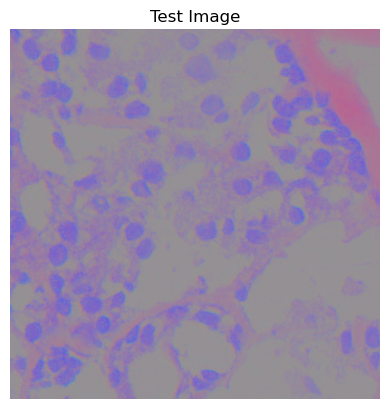

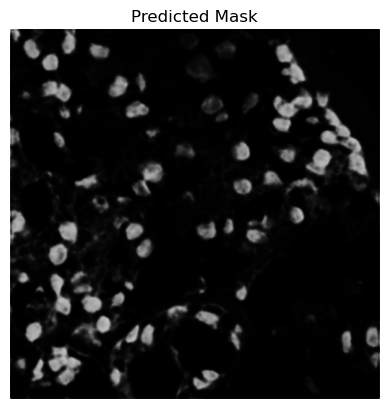

In [29]:
# Assuming you already have the U-Net model created and compiled (as 'model')

# Step 2: Load and preprocess data
# ... (use the provided code to load and preprocess the data)

# Step 3: Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Step 4: Train the model
# Assuming you have separate arrays for training images and masks
model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_val, y_val))

# Step 5: Evaluate the model (optional)
# Assuming you have separate arrays for validation images and masks
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss}, Validation Accuracy: {accuracy}")

# Step 6: Make predictions
# Assuming you have a test set (X_test) for which you want to make predictions
predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 0  # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()


1/1 [==============================] - 12s 12s/step


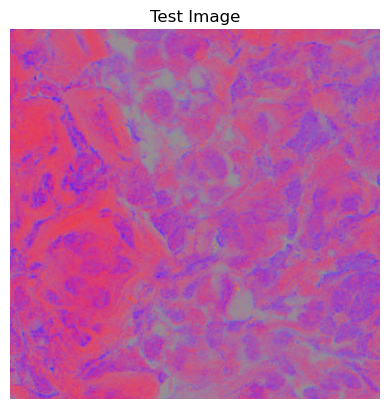

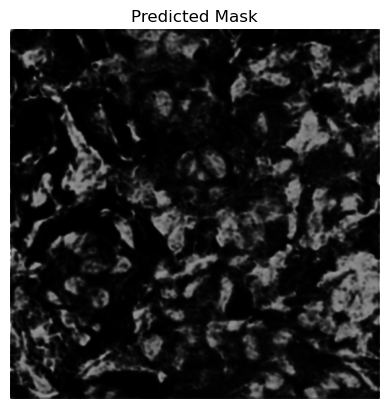

In [30]:
 predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 1 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

1/1 [==============================] - 5s 5s/step


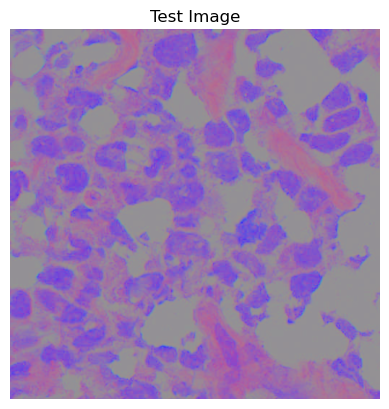

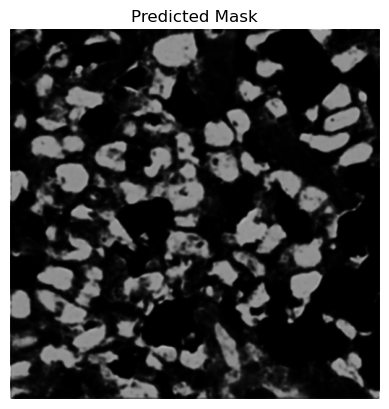

In [35]:
 predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 2 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

1/1 [==============================] - 5s 5s/step


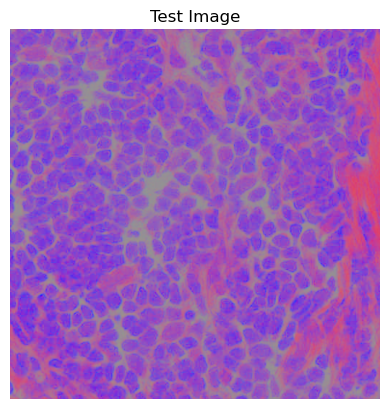

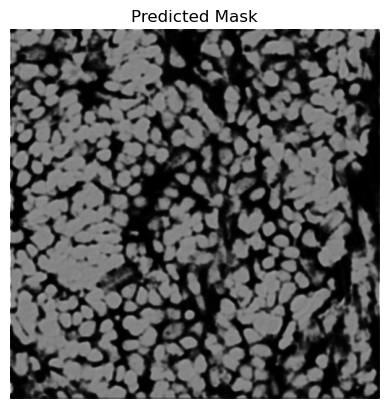

In [37]:
 predictions = model.predict(X_val)

# (Optional) Visualize some predictions
id = 5 # Change this to visualize predictions for a different image
plt.imshow(X_val[id])
plt.axis('off')
plt.title('Test Image')
plt.show()

plt.imshow(predictions[id, :, :, 0], cmap='gray')
plt.axis('off')
plt.title('Predicted Mask')
plt.show()

In [38]:
import numpy as np

def calculate_dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    
    dice_coefficient = (2.0 * intersection) / (union + intersection)
    
    return dice_coefficient


In [45]:
# Assuming train_files_labels is your ground truth label masks for training set
# Let's use a portion of it for demonstration purposes
num_samples_for_evaluation = 6
y_true_val = []

for i in range(num_samples_for_evaluation):
    y_true_val.append(imread(train_files_labels[i]))

y_true_val = np.array(y_true_val)

# Now, let's calculate the Dice coefficient
dice_scores = []

for i in range(len(y_true_val)):
    dice_coefficient = calculate_dice_coefficient(y_true_val[i, :, :], predictions[i, :, :, 0])
    dice_scores.append(dice_coefficient)

average_dice_score = np.mean(dice_scores)

print(f'Average Dice Coefficient: {average_dice_score}')


Average Dice Coefficient: 0.047329619386974886
